In [ ]:
from google.colab import drive
drive.mount('/content/data')

Mounted at /content/data


In [ ]:
import os
import config
import downloader

In [ ]:
PATH_TO_SAFEBOORU_ALL_DATA_CSV = '/content/data/MyDrive/cartoonGAN/all_data.csv'
PATH_TO_STORE_DOWNLOADED_CARTOON_IMAGES = '/content/data/MyDrive/cartoonGAN/safebooru/'
CARTOON_IMAGES_ZIPFILE_NAME = '/content/data/MyDrive/cartoonGAN/safebooru'

def main():
    if not os.path.exists(PATH_TO_STORE_DOWNLOADED_CARTOON_IMAGES):
        os.makedirs(PATH_TO_STORE_DOWNLOADED_CARTOON_IMAGES)

    with open(PATH_TO_SAFEBOORU_ALL_DATA_CSV) as raw_data:
        raw_data.readline() # ignore header line by reading it
        counter = downloader.init_counter(PATH_TO_STORE_DOWNLOADED_CARTOON_IMAGES)
        while counter <= config.COUNT_IMAGES_TO_DOWNLOAD:
            success = fetch_and_save_image(raw_data.readline())
            if success:
                counter += 1
                print('Download #', counter)
        downloader.zip_images(CARTOON_IMAGES_ZIPFILE_NAME, PATH_TO_STORE_DOWNLOADED_CARTOON_IMAGES)

def fetch_and_save_image(raw_data_line):
    url = get_image_url(raw_data_line)
    if url.endswith(".jpg"): # download jpg only
        filename_with_path = get_filename_with_path(url)
        return downloader.download_non_already_existing_images(filename_with_path, url)
    else:
        return False

def get_image_url(raw_data_line):
    return 'http:' + raw_data_line.split(',')[4].replace("\"", '')

def get_filename_with_path(url):
    return PATH_TO_STORE_DOWNLOADED_CARTOON_IMAGES + url.split('/')[5]

if __name__ == '__main__':
    main()

Already downloaded files:  232
Skipping file, already exists:  /content/data/MyDrive/cartoonGAN/safebooru/sample_e7b3dc281d431f7a9f4ab81986d2de9a20d36d2e.jpg
Skipping file, already exists:  /content/data/MyDrive/cartoonGAN/safebooru/sample_27ff11b17a2c3f83dcb6d1e10b8b3191b4ffb129.jpg
Skipping file, already exists:  /content/data/MyDrive/cartoonGAN/safebooru/sample_113cb63dc5412ca1ecf59d82bddedcd4d5aa6a23.jpg
Skipping file, already exists:  /content/data/MyDrive/cartoonGAN/safebooru/sample_b60156c722313685fd398b83208a57c138f9e0dc.jpg
Skipping file, already exists:  /content/data/MyDrive/cartoonGAN/safebooru/sample_253c55b8e4f6872152c2e5d75d9b45cf5ffde017.jpg
Skipping file, already exists:  /content/data/MyDrive/cartoonGAN/safebooru/sample_24f0c579396f9870146ad476fe7bdc6a54cb6f52.jpg
Skipping file, already exists:  /content/data/MyDrive/cartoonGAN/safebooru/sample_a11161f5d5da15b89586a083c4bacdb4d779f945.jpg
Skipping file, already exists:  /content/data/MyDrive/cartoonGAN/safebooru/sampl

In [ ]:
import os
import cv2
from PIL import Image, ImageFilter
import downloader


In [ ]:
PATH_TO_STORED_CARTOON_IMAGES = '/content/data/MyDrive/cartoonGAN/safebooru/'
PATH_TO_STORE_SMOOTHED_IMAGES = '/content/data/MyDrive/cartoonGAN/safebooru_smoothed/'
SMOOTHED_IMAGES_ZIPFILE_NAME = '/content/data/MyDrive/cartoonGAN/safebooru_smoothed'

In [ ]:
def main():
    if not os.path.exists(PATH_TO_STORED_CARTOON_IMAGES):
        print("Can not smooth images, path does not exist: ", PATH_TO_STORED_CARTOON_IMAGES)

    if not os.path.exists(PATH_TO_STORE_SMOOTHED_IMAGES):
        os.makedirs(PATH_TO_STORE_SMOOTHED_IMAGES)

    for filename in os.listdir(PATH_TO_STORED_CARTOON_IMAGES):
        cartoon_images_filename = PATH_TO_STORED_CARTOON_IMAGES + filename
        smoothed_images_filename = PATH_TO_STORE_SMOOTHED_IMAGES + filename

        if not os.path.exists(smoothed_images_filename):
            edge_smoothing(cartoon_images_filename, smoothed_images_filename)
        else:
            print("Skipping file, already exists, ", cartoon_images_filename)

    downloader.zip_images(SMOOTHED_IMAGES_ZIPFILE_NAME, PATH_TO_STORE_SMOOTHED_IMAGES)

def edge_smoothing(cartoon_images_filename, smoothed_images_filename):
    print("Edge-smoothing of ", cartoon_images_filename)
    origin = cv2.imread(cartoon_images_filename)
    edges = createEdgesOverlay(origin)
    result = overlayEdges(edges, origin)
    result.save(smoothed_images_filename, "JPEG")

def overlayEdges(edges, origin):
    background = transformFromCV2ToPillowImageFormat(origin)
    background.paste(edges, (0, 0), edges)
    background = background.convert("RGB")
    return background

def transformFromCV2ToPillowImageFormat(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGBA)
    return Image.fromarray(img)

def createEdgesOverlay(origin):
    edges = cv2.Canny(origin, 30, 300, 3)
    edges = cv2.dilate(edges, (3, 3))
    edges = cv2.bitwise_not(edges)
    edges = transformFromCV2ToPillowImageFormat(edges)
    makeWhiteBackgroundTransparent(edges)
    edges = edges.filter(ImageFilter.GaussianBlur)

    return edges

def makeWhiteBackgroundTransparent(img):
    datas = img.getdata()
    newData = []
    for item in datas:
        if item[0] == 255 and item[1] == 255 and item[2] == 255:
            newData.append((255, 255, 255, 0))
        else:
            newData.append(item)
    img.putdata(newData)

if __name__ == '__main__':
    main()

Edge-smoothing of  /content/data/MyDrive/cartoonGAN/safebooru/sample_7fafc696b638e186cae898022b600a343e85a934.jpg
Edge-smoothing of  /content/data/MyDrive/cartoonGAN/safebooru/85d67da83d425d2902380e61728f423b4a0a37e4.jpg
Edge-smoothing of  /content/data/MyDrive/cartoonGAN/safebooru/sample_344be6a0d717fd8f712e0904dee747174b8db276.jpg
Edge-smoothing of  /content/data/MyDrive/cartoonGAN/safebooru/026a06dc1e9573b3555eae77ee4daf1610ea87b2.jpg
Edge-smoothing of  /content/data/MyDrive/cartoonGAN/safebooru/dc65f2cf0f94c91cdfedc288db0fa9f241dba191.jpg
Edge-smoothing of  /content/data/MyDrive/cartoonGAN/safebooru/sample_f859783335a28bf784722f966eaf08956804a835.jpg
Edge-smoothing of  /content/data/MyDrive/cartoonGAN/safebooru/sample_256b046201c96be5ae19510e9026686627e1b6b5.jpg
Edge-smoothing of  /content/data/MyDrive/cartoonGAN/safebooru/sample_13a1e3d2314af05e29eaf7b2a3e42b520ee58e08.jpg
Edge-smoothing of  /content/data/MyDrive/cartoonGAN/safebooru/sample_f0b4e1fa763534803f54f8825681d134d6333eb2

In [ ]:
import os
from pycocotools.coco import COCO
import downloader
import config

In [ ]:
import os
from pycocotools.coco import COCO
import downloader
import config

PATH_TO_STORE_DOWNLOADED_PHOTOS = "/content/data/MyDrive/cartoonGAN/photos/"
PATH_TO_COCO_ANNOTATIONS_ROOT_FOLDER = "/content/data/MyDrive/cartoonGAN"
DATA_TYPE='train2017'
ANNOTATION_FILE = '{}/annotations/instances_{}.json'.format(PATH_TO_COCO_ANNOTATIONS_ROOT_FOLDER, DATA_TYPE)
PHOTO_ZIPFILE_NAME = '/content/data/MyDrive/cartoonGAN/coco'

def main():
    if not os.path.exists(PATH_TO_STORE_DOWNLOADED_PHOTOS):
        os.makedirs(PATH_TO_STORE_DOWNLOADED_PHOTOS)

    coco = COCO(ANNOTATION_FILE)

    personCategory = coco.getCatIds(catNms=['person'])
    personImageIds = coco.getImgIds(catIds=personCategory)
    personImageData = coco.loadImgs(personImageIds)
    personImageDataIterator = iter(personImageData)

    counter = downloader.init_counter(PATH_TO_STORE_DOWNLOADED_PHOTOS)
    while counter <= config.COUNT_IMAGES_TO_DOWNLOAD:
        try:
            filename_with_path, url = get_filename_and_url(personImageDataIterator)
            success = downloader.download_non_already_existing_images(filename_with_path, url)
            if success:
                counter += 1
                print("Download #", counter)
        except StopIteration:
            print('Tried to download more photos than available, stopping.')
            counter = config.COUNT_IMAGES_TO_DOWNLOAD + 1
            pass
    downloader.zip_images(PHOTO_ZIPFILE_NAME, PATH_TO_STORE_DOWNLOADED_PHOTOS)

def get_filename_and_url(personImageDataIterator):
    photo_data = next(personImageDataIterator)
    url = photo_data['coco_url']
    filename = photo_data['file_name']
    filename_with_path = PATH_TO_STORE_DOWNLOADED_PHOTOS + filename

    return filename_with_path, url

if __name__ == '__main__':
    main()

loading annotations into memory...
Done (t=24.93s)
creating index...
index created!
Already downloaded files:  0
Download # 1
Download # 2
Download # 3
Download # 4
Download # 5
Download # 6
Download # 7
Download # 8
Download # 9
Download # 10
Download # 11
Download # 12
Download # 13
Download # 14
Download # 15
Download # 16
Download # 17
Download # 18
Download # 19
Download # 20
Download # 21
Download # 22
Download # 23
Download # 24
Download # 25
Download # 26
Download # 27
Download # 28
Download # 29
Download # 30
Download # 31
Download # 32
Download # 33
Download # 34
Download # 35
Download # 36
Download # 37
Download # 38
Download # 39
Download # 40
Download # 41
Download # 42
Download # 43
Download # 44
Download # 45
Download # 46
Download # 47
Download # 48
Download # 49
Download # 50
Download # 51
Download # 52
Download # 53
Download # 54
Download # 55
Download # 56
Download # 57
Download # 58
Download # 59
Download # 60
Download # 61
Download # 62
Download # 63
Download # 64


In [ ]:
!mkdir cartoons
!mkdir cartoons/1
!unzip -n -q /content/data/My\ Drive/cartoonGAN/safebooru.zip -d cartoons/1/

In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms
from torch.utils.data import random_split
import math

image_size = 256
batch_size = 16

transformer = transforms.Compose([
    transforms.CenterCrop(image_size),
    transforms.ToTensor() # ToTensor() changes the range of the values from [0, 255] to [0.0, 1.0]
])

cartoon_dataset = ImageFolder('cartoons/', transformer)
len_training_set = math.floor(len(cartoon_dataset) * 0.9)
len_valid_set = len(cartoon_dataset) - len_training_set

training_set, _ = random_split(cartoon_dataset, (len_training_set, len_valid_set))
cartoon_image_dataloader_train = DataLoader(training_set, batch_size, shuffle=True, num_workers=0)

torch.Size([3, 256, 256])
Current range: 0.08627451211214066 to 1.0


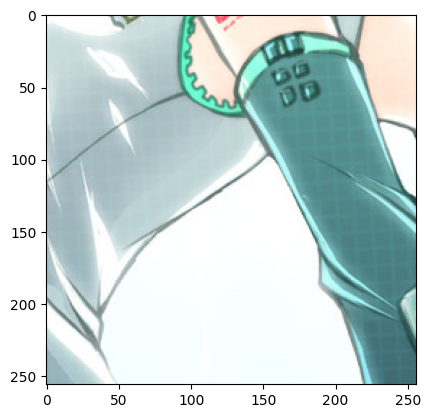

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def show_sample_image(dataloader):
    iterator = iter(dataloader)
    sample_batch, _ = next(iterator)
    first_sample_image_of_batch = sample_batch[0]
    print(first_sample_image_of_batch.size())
    print("Current range: {} to {}".format(first_sample_image_of_batch.min(), first_sample_image_of_batch.max()))
    plt.imshow(np.transpose(first_sample_image_of_batch.numpy(), (1, 2, 0)))
    plt.show()

show_sample_image(cartoon_image_dataloader_train)

In [ ]:
!mkdir cartoons_smoothed
!mkdir cartoons_smoothed/1
!unzip -n -q /content/data/My\ Drive/cartoonGAN/safebooru_smoothed.zip -d cartoons_smoothed/1/

In [ ]:
smoothed_cartoon_dataset = ImageFolder('cartoons_smoothed/', transformer)
len_training_set = math.floor(len(smoothed_cartoon_dataset) * 0.9)
len_valid_set = len(smoothed_cartoon_dataset) - len_training_set
training_set, _ = random_split(smoothed_cartoon_dataset, (len_training_set, len_valid_set))
smoothed_cartoon_image_dataloader_train = DataLoader(training_set, batch_size, shuffle=True, num_workers=0)

torch.Size([3, 256, 256])
Current range: 0.03921568766236305 to 1.0


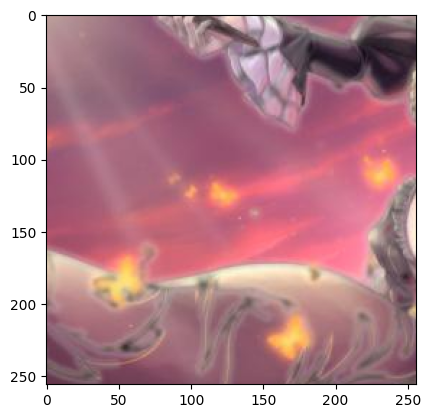

In [ ]:
show_sample_image(smoothed_cartoon_image_dataloader_train)

In [ ]:
!mkdir photos
!mkdir photos/1
!unzip -n -q /content/data/My\ Drive/cartoonGAN/coco.zip -d photos/1

In [ ]:
photo_dataset = ImageFolder('photos/', transformer)
len_training_set = math.floor(len(photo_dataset) * 0.9)
len_valid_set = len(photo_dataset) - len_training_set
training_set, validation_set = random_split(photo_dataset, (len_training_set, len_valid_set))
photo_dataloader_train = DataLoader(training_set, batch_size, shuffle=True, num_workers=0)
photo_dataloader_valid = DataLoader(validation_set, batch_size, shuffle=True, num_workers=0)

torch.Size([3, 256, 256])
Current range: 0.0 to 1.0


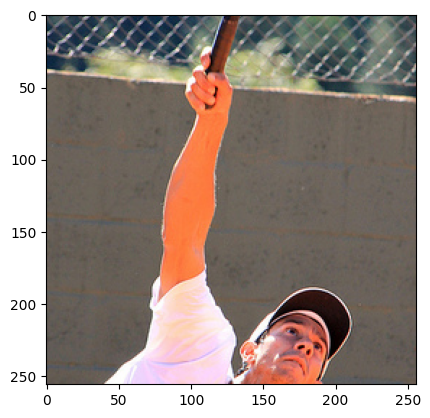

In [ ]:
show_sample_image(photo_dataloader_train)

In [ ]:
!mkdir /content/data/My\ Drive/cartoonGAN/tensorboard/

mkdir: cannot create directory ‘/content/data/My Drive/cartoonGAN/tensorboard/’: File exists


In [ ]:
%tensorflow_version 2.x

from torch.utils.tensorboard import SummaryWriter

tensorboard_logdir = '/content/data/My Drive/cartoonGAN/tensorboard'
writer = SummaryWriter(tensorboard_logdir)

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [ ]:
import torch.nn as nn
import torch.nn.functional as F
from torch import sigmoid

class ResidualBlock(nn.Module):
  def __init__(self):
    super(ResidualBlock, self).__init__()
    self.conv_1 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1)
    self.conv_2 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1)
    self.norm_1 = nn.BatchNorm2d(256)
    self.norm_2 = nn.BatchNorm2d(256)

  def forward(self, x):
    output = self.norm_2(self.conv_2(F.relu(self.norm_1(self.conv_1(x)))))
    return output + x #ES

class Generator(nn.Module):
    def __init__(self):
      super(Generator, self).__init__()
      self.conv_1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=7, stride=1, padding=3)
      self.norm_1 = nn.BatchNorm2d(64)

      # down-convolution #
      self.conv_2 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=2, padding=1)
      self.conv_3 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1)
      self.norm_2 = nn.BatchNorm2d(128)

      self.conv_4 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=2, padding=1)
      self.conv_5 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1)
      self.norm_3 = nn.BatchNorm2d(256)

      # residual blocks #
      residualBlocks = []
      for l in range(8):
        residualBlocks.append(ResidualBlock())
      self.res = nn.Sequential(*residualBlocks)

      # up-convolution #
      self.conv_6 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=3, stride=2, padding=1, output_padding=1)
      self.conv_7 = nn.ConvTranspose2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1)
      self.norm_4 = nn.BatchNorm2d(128)

      self.conv_8 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=3, stride=2, padding=1, output_padding=1)
      self.conv_9 = nn.ConvTranspose2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1)
      self.norm_5 = nn.BatchNorm2d(64)

      self.conv_10 = nn.Conv2d(in_channels=64, out_channels=3, kernel_size=7, stride=1, padding=3)

    def forward(self, x):
      x = F.relu(self.norm_1(self.conv_1(x)))

      x = F.relu(self.norm_2(self.conv_3(self.conv_2(x))))
      x = F.relu(self.norm_3(self.conv_5(self.conv_4(x))))

      x = self.res(x)
      x = F.relu(self.norm_4(self.conv_7(self.conv_6(x))))
      x = F.relu(self.norm_5(self.conv_9(self.conv_8(x))))

      x = self.conv_10(x)

      x = sigmoid(x)

      return x

In [ ]:
G = Generator()
print(G)

Generator(
  (conv_1): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
  (norm_1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_2): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv_3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_4): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv_5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (res): Sequential(
    (0): ResidualBlock(
      (conv_1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (conv_2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (norm_1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     

In [ ]:
class Discriminator(nn.Module):
  def __init__(self):
     super(Discriminator, self).__init__()
     self.conv_1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1)

     self.conv_2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=2, padding=1)
     self.conv_3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1)
     self.norm_1 = nn.BatchNorm2d(128)

     self.conv_4 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=2, padding=1)
     self.conv_5 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1)
     self.norm_2 = nn.BatchNorm2d(256)

     self.conv_6 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1)
     self.norm_3 = nn.BatchNorm2d(256)

     self.conv_7 = nn.Conv2d(in_channels=256, out_channels=1, kernel_size=3, stride=1, padding=1)

  def forward(self, x):
    x = F.leaky_relu(self.conv_1(x))
    x = F.leaky_relu(self.norm_1(self.conv_3(F.leaky_relu(self.conv_2(x)))), negative_slope=0.2)
    x = F.leaky_relu(self.norm_2(self.conv_5(F.leaky_relu(self.conv_4(x)))), negative_slope=0.2)
    x = F.leaky_relu(self.norm_3(self.conv_6(x)), negative_slope=0.2)
    x = self.conv_7(x)
    x = sigmoid(x)

    return x

In [ ]:
D = Discriminator()
print(D)

Discriminator(
  (conv_1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv_2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv_5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_6): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_7): Conv2d(256, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)


In [ ]:
import torch

device = torch.device('cpu')

if torch.cuda.is_available():
  device = torch.device('cuda')
  print("Train on GPU.")
else:
  print("No cuda available")

G.to(device)
D.to(device)

No cuda available


Discriminator(
  (conv_1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv_2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv_5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_6): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_7): Conv2d(256, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)

In [ ]:
from torchvision import models

path_to_pretrained_vgg16 = '/content/data/My Drive/cartoonGAN/vgg16-397923af.pth'

try:
  pretrained = torch.load(path_to_pretrained_vgg16)
  vgg16 = models.vgg16(pretrained=False)
  vgg16.load_state_dict(pretrained)
  vgg16 = vgg16.to(device)
except FileNotFoundError:
  vgg16 = models.vgg16(pretrained=True)
  torch.save(vgg16, path_to_pretrained_vgg16)
  vgg16 = vgg16.to(device)
# due VGG16 has 5 pooling-layer, I assume conv4_4 is the 4th pooling layer
# (23): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
feature_extractor = vgg16.features[:24]
for param in feature_extractor.parameters():
  param.require_grad = False

print(feature_extractor)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:07<00:00, 73.7MB/s]


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
from torchvision import models
from torch.nn import BCELoss

class DiscriminatorLoss(torch.nn.Module):
  def __init__(self):
      super(DiscriminatorLoss, self).__init__()
      self.bce_loss = BCELoss()

  def forward(self, discriminator_output_of_cartoon_input,
              discriminator_output_of_cartoon_smoothed_input,
              discriminator_output_of_generated_image_input,
              epoch,
              write_to_tensorboard=False):

    return self._adversarial_loss(discriminator_output_of_cartoon_input,
                     discriminator_output_of_cartoon_smoothed_input,
                     discriminator_output_of_generated_image_input,
                     epoch,
                     write_to_tensorboard)

  def _adversarial_loss(self, discriminator_output_of_cartoon_input,
                     discriminator_output_of_cartoon_smoothed_input,
                     discriminator_output_of_generated_image_input,
                     epoch,
                     write_to_tensorboard):

    # define ones and zeros here instead within __init__ due to have same shape as input
    # due to testing different batch_sizes, sometimes the "last batch" has < batch_size elements
    actual_batch_size = discriminator_output_of_cartoon_input.size()[0]
    zeros = torch.zeros([actual_batch_size, 1, 64, 64]).to(device)
    ones = torch.ones([actual_batch_size, 1, 64, 64]).to(device)

    d_loss_cartoon = self.bce_loss(discriminator_output_of_cartoon_input, ones)
    d_loss_cartoon_smoothed = self.bce_loss(discriminator_output_of_cartoon_smoothed_input, zeros)
    d_loss_generated_input = self.bce_loss(discriminator_output_of_generated_image_input, zeros)

    d_loss = d_loss_cartoon + d_loss_cartoon_smoothed + d_loss_generated_input

    if write_to_tensorboard:
      writer.add_scalar('d_loss_cartoon', d_loss_cartoon,epoch)
      writer.add_scalar('d_loss_cartoon_smoothed', d_loss_cartoon_smoothed, epoch)
      writer.add_scalar('d_loss_generated_input', d_loss_generated_input, epoch)
      writer.add_scalar('d_loss', d_loss, epoch)

    return d_loss

In [ ]:
class GeneratorLoss(torch.nn.Module):
  def __init__(self):
      super(GeneratorLoss, self).__init__()
      self.w = 0.000005
      self.bce_loss = BCELoss()
      self.feature_extractor = vgg16.features[:24]
      for param in self.feature_extractor.parameters():
        param.require_grad = False

  def forward(self, discriminator_output_of_generated_image_input,
              generator_input,
              generator_output,
              epoch,
              is_init_phase=False,
              write_to_tensorboard=False):
    if is_init_phase:
      g_content_loss = self._content_loss(generator_input, generator_output)
      g_adversarial_loss = 0.0
      g_loss = g_content_loss
    else:
      g_adversarial_loss = self._adversarial_loss_generator_part_only(discriminator_output_of_generated_image_input)
      g_content_loss = self._content_loss(generator_input, generator_output)
      g_loss = g_adversarial_loss + self.w * g_content_loss

    if write_to_tensorboard:
      writer.add_scalar('g_adversarial_loss', g_adversarial_loss, epoch)
      writer.add_scalar('g_content_loss', g_content_loss, epoch)
      writer.add_scalar('g_loss', g_loss, epoch)

    return g_loss

  def _adversarial_loss_generator_part_only(self, discriminator_output_of_generated_image_input):
    actual_batch_size = discriminator_output_of_generated_image_input.size()[0]
    ones = torch.ones([actual_batch_size, 1, 64, 64]).to(device)
    return self.bce_loss(discriminator_output_of_generated_image_input, ones)

  def _content_loss(self, generator_input, generator_output):
    return (self.feature_extractor(generator_output) - self.feature_extractor(generator_input)).norm(p=1)

In [ ]:
discriminatorLoss = DiscriminatorLoss()
generatorLoss = GeneratorLoss()

In [ ]:
import torch.optim as optim

lr = 0.0002
beta1 = 0.5
beta2 = 0.999

d_optimizer = optim.Adam(D.parameters(), lr, [beta1, beta2])
g_optimizer = optim.Adam(G.parameters(), lr, [beta1, beta2])

In [ ]:
intermediate_results_training_path = "/content/data/My Drive/cartoonGAN/intermediate_results/training/"

In [ ]:
def save_training_result(input, output):
  # input/output has batch-size number of images, get first one and detach from tensor
  image_input = input[0].detach().cpu().numpy()
  image_output = output[0].detach().cpu().numpy()
  # transponse image from torch.Size([3, 256, 256]) to (256, 256, 3)
  image_input = np.transpose(image_input, (1, 2, 0))
  image_output = np.transpose(image_output, (1, 2, 0))

  # generate filenames as timestamp, this orders the output by time
  filename = str(int(time.time()))
  path_input = intermediate_results_training_path + filename + "_input.jpg"
  path_output = intermediate_results_training_path + filename + ".jpg"
  plt.imsave(path_input, image_input)
  plt.imsave(path_output, image_output)


In [ ]:
def write_model_weights_and_bias_to_tensorboard(prefix, state_dict, epoch):
  for param in state_dict:
      writer.add_histogram(f"{prefix}_{param}", state_dict[param], epoch)

In [ ]:
import time

def train(_num_epochs, checkpoint_dir, best_valid_loss, epochs_already_done, losses, validation_losses):
  init_epochs = 10
  print_every = 100
  start_time = time.time()

  for epoch in range(_num_epochs - epochs_already_done):
    epoch = epoch + epochs_already_done

    for index, ((photo_images, _), (smoothed_cartoon_images, _), (cartoon_images, _)) in enumerate(zip(photo_dataloader_train, smoothed_cartoon_image_dataloader_train, cartoon_image_dataloader_train)):
      batch_size = photo_images.size(0)
      photo_images = photo_images.to(device)
      smoothed_cartoon_images = smoothed_cartoon_images.to(device)
      cartoon_images = cartoon_images.to(device)

      # train the discriminator
      d_optimizer.zero_grad()

      d_of_cartoon_input = D(cartoon_images)
      d_of_cartoon_smoothed_input = D(smoothed_cartoon_images)
      d_of_generated_image_input = D(G(photo_images))

      write_only_one_loss_from_epoch_not_every_batch_loss = (index == 0)

      d_loss = discriminatorLoss(d_of_cartoon_input,
                                 d_of_cartoon_smoothed_input,
                                 d_of_generated_image_input,
                                 epoch,
                                 write_to_tensorboard=write_only_one_loss_from_epoch_not_every_batch_loss)

      d_loss.backward()
      d_optimizer.step()

      # train the generator
      g_optimizer.zero_grad()

      g_output = G(photo_images)

      d_of_generated_image_input = D(g_output)

      if epoch < init_epochs:
        # init
        init_phase = True
      else:
        # train
        init_phase = False

      g_loss = generatorLoss(d_of_generated_image_input,
                              photo_images,
                              g_output,
                              epoch,
                              is_init_phase=init_phase,
                              write_to_tensorboard=write_only_one_loss_from_epoch_not_every_batch_loss)

      g_loss.backward()
      g_optimizer.step()

      if (index % print_every) == 0:
        losses.append((d_loss.item(), g_loss.item()))
        now = time.time()
        current_run_time = now - start_time
        start_time = now
        print("Epoch {}/{} | d_loss {:6.4f} | g_loss {:6.4f} | time {:2.0f}s | total no. of losses {}".format(epoch+1, _num_epochs, d_loss.item(), g_loss.item(), current_run_time, len(losses)))

    # write to tensorboard
      #write_model_weights_and_bias_to_tensorboard('D', D.state_dict(), epoch)
      #write_model_weights_and_bias_to_tensorboard('G', G.state_dict(), epoch)
    # save some intermediate results during training
    save_training_result(photo_images, g_output)

    # validate
    with torch.no_grad():
      D.eval()
      G.eval()

      for batch_index, (photo_images, _) in enumerate(photo_dataloader_valid):
        photo_images = photo_images.to(device)

        g_output = G(photo_images)
        d_of_generated_image_input = D(g_output)
        g_valid_loss = generatorLoss(d_of_generated_image_input,
                                      photo_images,
                                      g_output,
                                      epoch,
                                      is_init_phase=init_phase,
                                      write_to_tensorboard=write_only_one_loss_from_epoch_not_every_batch_loss)

        if batch_index % print_every == 0:
          validation_losses.append(g_valid_loss.item())
          now = time.time()
          current_run_time = now - start_time
          start_time = now
          print("Epoch {}/{} | validation loss {:6.4f} | time {:2.0f}s | total no. of losses {}".format(epoch+1, _num_epochs, g_valid_loss.item(), current_run_time, len(validation_losses)))

    D.train()
    G.train()

    if(g_valid_loss.item() < best_valid_loss):
      print("Generator loss improved from {} to {}".format(best_valid_loss, g_valid_loss.item()))
      best_valid_loss = g_valid_loss.item()

    # save checkpoint
    checkpoint = {'g_valid_loss': g_valid_loss.item(),
                  'best_valid_loss': best_valid_loss,
                  'losses': losses,
                  'validation_losses': validation_losses,
                  'last_epoch': epoch+1,
                  'd_state_dict': D.state_dict(),
                  'g_state_dict': G.state_dict(),
                  'd_optimizer_state_dict': d_optimizer.state_dict(),
                  'g_optimizer_state_dict': g_optimizer.state_dict()
                }
    print("Save checkpoint for validation loss of {}".format(g_valid_loss.item()))
    torch.save(checkpoint, checkpoint_dir + '/checkpoint_epoch_{:03d}.pth'.format(epoch+1))
    if(best_valid_loss == g_valid_loss.item()):
      print("Overwrite best checkpoint")
      torch.save(checkpoint, checkpoint_dir + '/best_checkpoint.pth')

  return losses, validation_losses

In [ ]:
from os import listdir
import math

checkpoint_dir = '/content/data/My Drive/cartoonGAN/checkpoints'
checkpoints = listdir(checkpoint_dir)
num_epochs = 90 + 10 # training + init phase
epochs_already_done = 0
best_valid_loss = math.inf
losses = []
validation_losses = []

if(len(checkpoints) > 0):
  last_checkpoint = sorted(checkpoints)[-1]
  checkpoint = torch.load(checkpoint_dir + '/' + last_checkpoint, map_location=torch.device(device))
  best_valid_loss = checkpoint['best_valid_loss']
  epochs_already_done = checkpoint['last_epoch']
  losses = checkpoint['losses']
  validation_losses = checkpoint['validation_losses']

  D.load_state_dict(checkpoint['d_state_dict'])
  G.load_state_dict(checkpoint['g_state_dict'])
  d_optimizer.load_state_dict(checkpoint['d_optimizer_state_dict'])
  g_optimizer.load_state_dict(checkpoint['g_optimizer_state_dict'])
  print('Load checkpoint {} with g_valid_loss {}, best_valid_loss {}, {} epochs and total no of losses {}'.format(last_checkpoint, checkpoint['g_valid_loss'], best_valid_loss, epochs_already_done, len(losses)))



Load checkpoint checkpoint_epoch_039.pth with g_valid_loss 3.836203098297119, best_valid_loss 1.1663435697555542, 39 epochs and total no of losses 117


In [ ]:
losses, validation_losses = train(num_epochs, checkpoint_dir, best_valid_loss, epochs_already_done, losses, validation_losses)


Epoch 33/100 | d_loss 0.0130 | g_loss 8.3492 | time 11s | total no. of losses 97
Epoch 33/100 | d_loss 0.0176 | g_loss 8.8655 | time 313s | total no. of losses 98
Epoch 33/100 | d_loss 0.0084 | g_loss 9.0213 | time 319s | total no. of losses 99
Epoch 33/100 | validation loss 5.3729 | time 79s | total no. of losses 33
Save checkpoint for validation loss of 3.922778367996216
Epoch 34/100 | d_loss 0.0140 | g_loss 9.7939 | time 16s | total no. of losses 100
Epoch 34/100 | d_loss 0.0117 | g_loss 8.0169 | time 315s | total no. of losses 101
Epoch 34/100 | d_loss 0.0116 | g_loss 6.8961 | time 316s | total no. of losses 102
Epoch 34/100 | validation loss 5.3259 | time 76s | total no. of losses 34
Save checkpoint for validation loss of 3.1452279090881348
Epoch 35/100 | d_loss 0.0122 | g_loss 8.4707 | time 16s | total no. of losses 103
Epoch 35/100 | d_loss 0.3381 | g_loss 2.6913 | time 315s | total no. of losses 104
Epoch 35/100 | d_loss 0.0127 | g_loss 9.6258 | time 316s | total no. of losses 

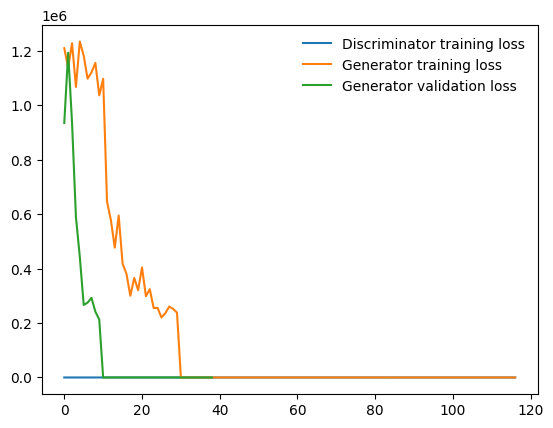

In [ ]:
%matplotlib inline
%config InlineBackend.figure.format = 'retina'

import matplotlib.pyplot as plt

d_losses = [x[0] for x in losses]
g_losses = [x[1] for x in losses]
plt.plot(d_losses, label='Discriminator training loss')
plt.plot(g_losses, label='Generator training loss')
plt.plot(validation_losses, label='Generator validation loss')
plt.legend(frameon=False)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir='/content/data/My Drive/cartoonGAN/tensorboard'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2357), started 0:02:13 ago. (Use '!kill 2357' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
checkpoint = torch.load(checkpoint_dir + '/best_checkpoint.pth', map_location=torch.device(device))
G_inference = Generator()
G_inference.load_state_dict(checkpoint['g_state_dict'])

<All keys matched successfully>

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming you have a DataLoader named photo_dataloader_valid

# Get the first batch from the DataLoader
data_iter = iter(photo_dataloader_valid)
test_images = next(data_iter)[0]

# Assuming G_inference and G are your generator models
result_images_best_checkpoint = G_inference(test_images)
result_images_checkpoint_after_210_epochs = G(test_images)

# Visualize the result_images_best_checkpoint[0]
plt.imshow(np.transpose(result_images_best_checkpoint[0].detach().numpy(), (1, 2, 0)))
plt.show()
